In [1]:
import os
import json
import copy
import yaml
import wandb
import numpy as np
import pandas as pd
from PIL import Image
from IPython.display import clear_output
from sklearn.model_selection import train_test_split, GroupShuffleSplit, GroupKFold

### Split train-test 

In [2]:
df = pd.read_csv('/data/user/nevil/doc_vqa/data/table_data/csv_outputs/v1/full_annotated_train_4800.csv')
df['questionId'] = range(len(df))
df['answers'] = df['answers'].fillna('NA')
df

,questionId,question,image,docId,ucsf_document_id,ucsf_document_page_no,answers
0,0,What is the HAEMOGLOBIN value?,/data/user/sudarshan/data/heamotology_all/1656...,1,1656651375095_Investigation report_p2.,1,11.9
1,1,What is the TOTAL LEUCOCYIE COUNT value?,/data/user/sudarshan/data/heamotology_all/1656...,1,1656651375095_Investigation report_p2.,1,9900
2,2,What is the NEUTKOPHES value?,/data/user/sudarshan/data/heamotology_all/1656...,1,1656651375095_Investigation report_p2.,1,62
3,3,What is the MONOCYTES value?,/data/user/sudarshan/data/heamotology_all/1656...,1,1656651375095_Investigation report_p2.,1,04
4,4,What is the Hacinoglobin) value?,/data/user/sudarshan/data/heamotology_all/1656...,1,1656651375095_Investigation report_p2.,1,31.534.5
...,...,...,...,...,...,...,...
60553,60553,What is the Lymphocytes value?,/data/user/sudarshan/data/heamotology_all/1561...,6900,1561475012049_INVESTIGATION REPORT 1_p0.,1,31
60554,60554,What is the Monocytes value?,/data/user/sudarshan/data/heamotology_all/1561...,6900,1561475012049_INVESTIGATION REPORT 1_p0.,1,03
60555,60555,What is the Basophils value?,/data/user/sudarshan/data/heamotology_all/1561...,6900,1561475012049_INVESTIGATION REPORT 1_p0.,1,00
60556,60556,What is the Other value?,/data/user/sudarshan/data/heamotology_all/1561...,6900,1561475012049_INVESTIGATION REPORT 1_p0.,1,00


In [46]:
splitter = GroupShuffleSplit(test_size=0.90, n_splits=2, random_state = 7)
split = splitter.split(df, groups=df['docId'])
train_inds, test_inds = next(split)
print(train_inds.shape, test_inds.shape)

(6054,) (54504,)


In [47]:
train_df = df.iloc[train_inds].reset_index(drop=True)
test_df = df.iloc[test_inds].reset_index(drop=True)
print(train_df.shape, test_df.shape)
print('Unique docs in tarin - {} {} & test - {} {}%'.format(train_df.docId.nunique(), round(len(train_inds)*100/df.shape[0], 2), test_df.docId.nunique(), round(len(test_inds)*100/df.shape[0], 2))) 
assert len(set(train_df.docId).intersection(set(test_df.docId))) == 0, print('Split is incorrect')

(6054, 7) (54504, 7)
Unique docs in tarin - 386 10.0 & test - 3481 90.0%


In [48]:
# train_df.to_csv('/data/user/nevil/doc_vqa/data/table_data/csv_outputs/v1/full_annotated_train_4800.csv', index=False)
test_df.to_csv('/data/user/nevil/doc_vqa/data/table_data/csv_outputs/v1/full_annotated_test_4800_90.csv', index=False)

### Prepare dataset

In [41]:
df = pd.read_csv('/data/user/nevil/doc_vqa/data/table_data/csv_outputs/v1/full_annotated_train_4800_10.csv')
df['questionId'] = range(len(df))
df['answers'] = df['answers'].fillna('NA')
df

,questionId,question,image,docId,ucsf_document_id,ucsf_document_page_no,answers
0,0,What is the Sr.Sodium value?,/data/user/sudarshan/data/heamotology_all/1656...,54,1656684112322_investigation reports 1_p2.,1,145
1,1,What is the Sr.Potassium value?,/data/user/sudarshan/data/heamotology_all/1656...,54,1656684112322_investigation reports 1_p2.,1,3.6
2,2,What is the Sr.Chloride value?,/data/user/sudarshan/data/heamotology_all/1656...,54,1656684112322_investigation reports 1_p2.,1,107
3,3,What is the S.G.O.T. value?,/data/user/sudarshan/data/heamotology_all/1656...,54,1656684112322_investigation reports 1_p2.,1,36
4,4,What is the S.G.P.T. value?,/data/user/sudarshan/data/heamotology_all/1656...,54,1656684112322_investigation reports 1_p2.,1,22
...,...,...,...,...,...,...,...
5719,5719,What is the Lymphocytes value?,/data/user/sudarshan/data/heamotology_all/1561...,6875,1561717685669_INVESTIGATION REPORTS_p0.,1,05
5720,5720,What is the Monocytes value?,/data/user/sudarshan/data/heamotology_all/1561...,6875,1561717685669_INVESTIGATION REPORTS_p0.,1,04
5721,5721,What is the Basophils value?,/data/user/sudarshan/data/heamotology_all/1561...,6875,1561717685669_INVESTIGATION REPORTS_p0.,1,00
5722,5722,What is the Other value?,/data/user/sudarshan/data/heamotology_all/1561...,6875,1561717685669_INVESTIGATION REPORTS_p0.,1,00


In [42]:
#df = pd.DataFrame(data['data'])
# df = pd.read_csv('/data/user/nevil/doc_vqa/data/table_data/csv_outputs/annotated_full_both_test.csv')
df.columns = ['questionId', 'question', 'image', 'docId', 'ucsf_document_id',
       'ucsf_document_page_no', 'answers']
df['updated_image_path'] = df['image']
df['image'] = df.updated_image_path.apply(lambda x: "/data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/{}".format(x.split('/')[-1]))
# df['image'] = df.apply(lambda x: "/data/minesh/table_gt_all_27/resized_files/{}".format(x['image'].split('/')[-1]), axis=1)
# df['answers'] = df.answers.apply(lambda x: str(x))
# df ['is_file'] = df.image.apply(lambda x: 1 if os.path.exists(x) else 0)
df['answers'] = df.answers.apply(lambda x: [x])
print(df.shape)
df.head()

(5724, 8)


,questionId,question,image,docId,ucsf_document_id,ucsf_document_page_no,answers,updated_image_path
0,0,What is the Sr.Sodium value?,/data/user/nevil/doc_vqa/data/table_data/cache...,54,1656684112322_investigation reports 1_p2.,1,[145],/data/user/sudarshan/data/heamotology_all/1656...
1,1,What is the Sr.Potassium value?,/data/user/nevil/doc_vqa/data/table_data/cache...,54,1656684112322_investigation reports 1_p2.,1,[3.6],/data/user/sudarshan/data/heamotology_all/1656...
2,2,What is the Sr.Chloride value?,/data/user/nevil/doc_vqa/data/table_data/cache...,54,1656684112322_investigation reports 1_p2.,1,[107],/data/user/sudarshan/data/heamotology_all/1656...
3,3,What is the S.G.O.T. value?,/data/user/nevil/doc_vqa/data/table_data/cache...,54,1656684112322_investigation reports 1_p2.,1,[36],/data/user/sudarshan/data/heamotology_all/1656...
4,4,What is the S.G.P.T. value?,/data/user/nevil/doc_vqa/data/table_data/cache...,54,1656684112322_investigation reports 1_p2.,1,[22],/data/user/sudarshan/data/heamotology_all/1656...


- Filter the single char answers

In [43]:
## TODO: add logic to match answers with OCR error
cache_data = pd.read_csv('/data/user/nevil/doc_vqa/data/table_data/cache/ocr_data_cache.csv')
new_df = pd.merge(cache_data, df, how='right', left_on='image_path', right_on='image')
new_df['answers_available'] = new_df.apply(lambda x: 1 if x['answers'][0] in x['texts'] and len(x['answers'][0]) > 1 else 0, axis=1)
print(new_df.shape)
new_df.head(1)

(5724, 13)


,image_path,boxes,texts,scores,questionId,question,image,docId,ucsf_document_id,ucsf_document_page_no,answers,updated_image_path,answers_available
0,/data/user/nevil/doc_vqa/data/table_data/cache...,"[[170, 53, 396, 77], [172, 81, 400, 103], [171...","['BETHANY', 'HOSPITALS', 'COMPASSION-CARE-COMM...","[0.9976035952568054, 0.9871642589569092, 0.979...",0,What is the Sr.Sodium value?,/data/user/nevil/doc_vqa/data/table_data/cache...,54,1656684112322_investigation reports 1_p2.,1,[145],/data/user/sudarshan/data/heamotology_all/1656...,1


In [44]:
# df = df.iloc[new_df[(new_df['answers_available'] == 1)].index].reset_index(drop=True)
print('Total questions :', df.shape[0])
print('Total unique documents :', df['docId'].nunique())

Total questions : 5724
Total unique documents : 387


In [45]:
df = df.iloc[new_df[(new_df['answers_available'] == 1)].index].reset_index(drop=True)
df

,questionId,question,image,docId,ucsf_document_id,ucsf_document_page_no,answers,updated_image_path
0,0,What is the Sr.Sodium value?,/data/user/nevil/doc_vqa/data/table_data/cache...,54,1656684112322_investigation reports 1_p2.,1,[145],/data/user/sudarshan/data/heamotology_all/1656...
1,1,What is the Sr.Potassium value?,/data/user/nevil/doc_vqa/data/table_data/cache...,54,1656684112322_investigation reports 1_p2.,1,[3.6],/data/user/sudarshan/data/heamotology_all/1656...
2,2,What is the Sr.Chloride value?,/data/user/nevil/doc_vqa/data/table_data/cache...,54,1656684112322_investigation reports 1_p2.,1,[107],/data/user/sudarshan/data/heamotology_all/1656...
3,3,What is the S.G.O.T. value?,/data/user/nevil/doc_vqa/data/table_data/cache...,54,1656684112322_investigation reports 1_p2.,1,[36],/data/user/sudarshan/data/heamotology_all/1656...
4,4,What is the S.G.P.T. value?,/data/user/nevil/doc_vqa/data/table_data/cache...,54,1656684112322_investigation reports 1_p2.,1,[22],/data/user/sudarshan/data/heamotology_all/1656...
...,...,...,...,...,...,...,...,...
4359,5719,What is the Lymphocytes value?,/data/user/nevil/doc_vqa/data/table_data/cache...,6875,1561717685669_INVESTIGATION REPORTS_p0.,1,[05],/data/user/sudarshan/data/heamotology_all/1561...
4360,5720,What is the Monocytes value?,/data/user/nevil/doc_vqa/data/table_data/cache...,6875,1561717685669_INVESTIGATION REPORTS_p0.,1,[04],/data/user/sudarshan/data/heamotology_all/1561...
4361,5721,What is the Basophils value?,/data/user/nevil/doc_vqa/data/table_data/cache...,6875,1561717685669_INVESTIGATION REPORTS_p0.,1,[00],/data/user/sudarshan/data/heamotology_all/1561...
4362,5722,What is the Other value?,/data/user/nevil/doc_vqa/data/table_data/cache...,6875,1561717685669_INVESTIGATION REPORTS_p0.,1,[00],/data/user/sudarshan/data/heamotology_all/1561...


What is the TOTALLEUCOCYTE COUNT value?


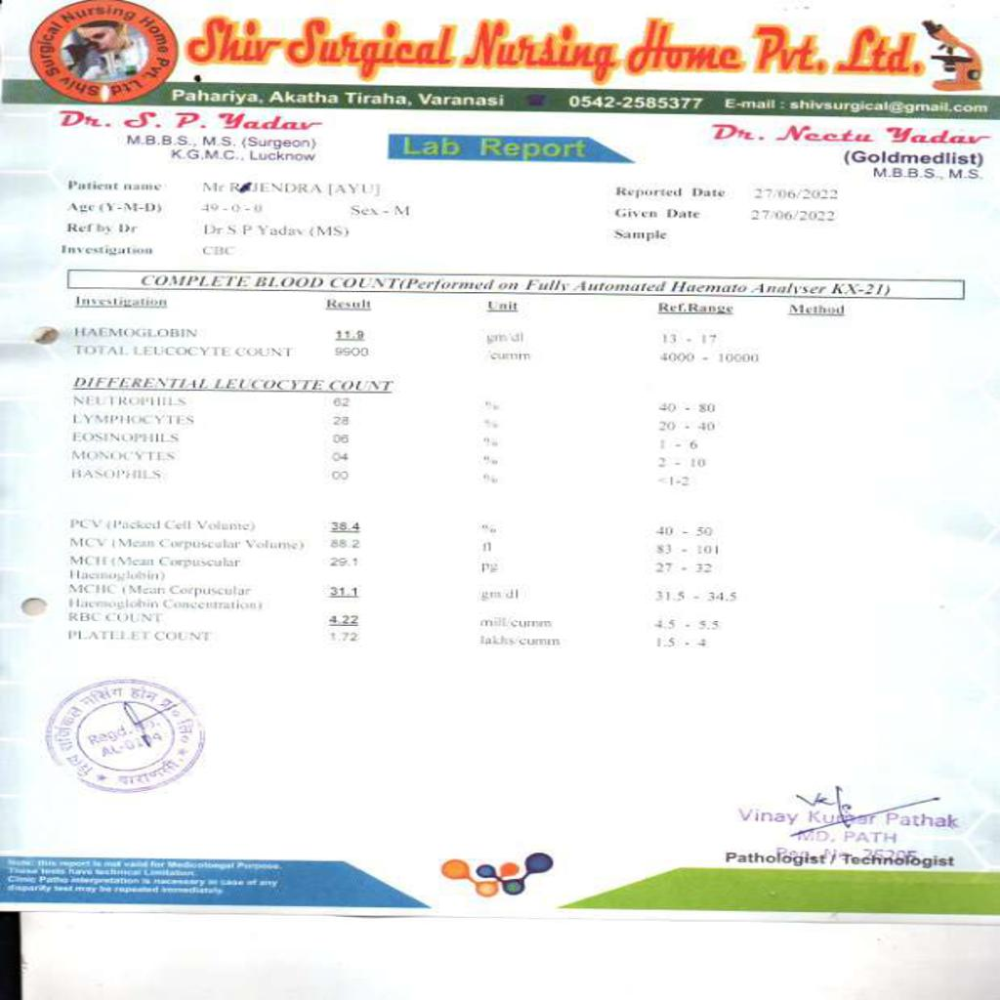

In [8]:
example = df.iloc[12]
question = example['question']
image = Image.open(example['image']).convert("RGB")
print(question)
image

In [50]:
model_checkpoint = "tiennvcs/layoutlmv2-base-uncased-finetuned-docvqa"
batch_size = 16

In [17]:
# pick a random example
example = df.iloc[0]
for k,v in example.items():
    print(k + ":", v)

questionId: 0
question: What is the Sr.Sodium value?
image: /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1656684112322_investigation reports 1_p2.jpeg
docId: 54
ucsf_document_id: 1656684112322_investigation reports 1_p2.
ucsf_document_page_no: 1
answers: ['145']
updated_image_path: /data/user/sudarshan/data/heamotology_all/1656684112322_investigation reports 1_p2.jpeg


In [51]:
from datasets import Dataset

dataset = Dataset.from_pandas(df)

In [14]:
import time
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from paddleocr import PaddleOCR
from transformers import LayoutLMv2FeatureExtractor

feature_extractor = LayoutLMv2FeatureExtractor()
ocr_model = PaddleOCR(use_angle_cls=True, lang="en")

def normalize_bbox(bbox, width, height):
    return [
        int(1000 * (bbox[0] / width)),
        int(1000 * (bbox[1] / height)),
        int(1000 * (bbox[2] / width)),
        int(1000 * (bbox[3] / height)),
    ]

class NumpyEncoder(json.JSONEncoder):
    def default(self, obj):
        if isinstance(obj, np.ndarray):
            return obj.tolist()
        return json.JSONEncoder.default(self, obj)

def resize_bounding_boxes(original_bbox, new_width, new_height, original_image_width, original_image_height): 
    
    # Calculate the resized bounding box based on the new image size
    resize_ratio_width = new_width / original_image_width
    resize_ratio_height = new_height / original_image_height
    resized_bbox = [
        int(original_bbox[0] * resize_ratio_width),
        int(original_bbox[1] * resize_ratio_height),
        int(original_bbox[2] * resize_ratio_width),
        int(original_bbox[3] * resize_ratio_height)
    ]

    return resized_bbox
    
def get_ocr_words_and_boxes(examples):

    print("--------------------------------------------------------------------------\n\n")
    json_file_path = "/data/user/nevil/doc_vqa/data/table_data/cache/ocr_data_cache.csv"
    if not os.path.exists(json_file_path): 
        cache_data = dict()
        cache_data_df = pd.DataFrame(columns=['image_path', 'boxes', 'texts', 'scores'])
    
    else: 
        cache_data_df = pd.read_csv(json_file_path)
        cache_data_df['boxes'] = cache_data_df.boxes.apply(lambda x: eval(x))
        cache_data_df['texts'] = cache_data_df.texts.apply(lambda x: eval(x))
        cache_data_df['scores'] = cache_data_df.scores.apply(lambda x: eval(x))
        cache_data_df['index_path'] = cache_data_df['image_path']
        cache_data = cache_data_df.set_index('index_path').to_dict('index')
    
    # get a batch of document images
    images = [Image.open(image_file).convert("RGB") for image_file in examples['image']]
    
    # resize every image to 224x224 + apply tesseract to get words + normalized boxes
    # encoded_inputs = feature_extractor(images)
    
    # custom OCR
    count = 0 
    image_list = list()
    words_list = list()
    boxes_list = list()
    resize_image = (1024, 1024)
    for idx, image_file in enumerate(examples['image']): 

        img_rgb = images[idx]
        img_array = np.asarray(img_rgb)
        filename = image_file.split('/')[-1]

        if image_file in cache_data: 

            print('using cache data..!', image_file)
            original_bboxes = cache_data[image_file]['boxes']
            boxes = [ resize_bounding_boxes(bbox, resize_image[0], resize_image[1], img_rgb.size[0], img_rgb.size[1]) for bbox in original_bboxes]
            texts = cache_data[image_file]['texts']
            
        else: 

            # Resize
            count += 1
            result = ocr_model.ocr(image_file, cls=True)
            flat_result = [item for sublist in result for item in sublist]

            # Resize the bounding boxes 
            boxes = [[int(line[0][0][0]), int(line[0][0][1]), int(line[0][2][0]), int(line[0][2][1])] for line in flat_result]
            texts = [line[1][0] for line in flat_result]
            scores = [line[1][1] for line in flat_result]
    
            cache_data.update({ image_file : {
                            "image_path" : image_file, 
                            "boxes" : boxes, 
                            "texts" : texts,
                            "scores" : scores }})
            
        words_list.append(texts)
        image_list.append(img_array)
        boxes_list.append(boxes)

    cache_data_list = [cache_data[key] for key in cache_data]    
    if count > 0: 
        cache_data_df = pd.DataFrame(cache_data_list)
        cache_data_df = cache_data_df.reset_index(drop=True)
        cache_data_df.to_csv(json_file_path, index=False)
   
    # examples['image'] = np.asarray([np.ones((3, 224, 224)) for _ in range(len(examples['image']))])
    examples['image'] = image_list
    examples['words'] = words_list
    examples['boxes'] = boxes_list
    
    # examples['image'] = encoded_inputs.pixel_values
    # examples['words'] = encoded_inputs.words
    # examples['boxes'] = encoded_inputs.boxes

    # clear_output(wait=True)
    return examples

[2023/12/12 12:21:33] ppocr DEBUG: Namespace(alpha=1.0, alphacolor=(255, 255, 255), benchmark=False, beta=1.0, binarize=False, cls_batch_num=6, cls_image_shape='3, 48, 192', cls_model_dir='/home/nhadmin/.paddleocr/whl/cls/ch_ppocr_mobile_v2.0_cls_infer', cls_thresh=0.9, cpu_threads=10, crop_res_save_dir='./output', det=True, det_algorithm='DB', det_box_type='quad', det_db_box_thresh=0.6, det_db_score_mode='fast', det_db_thresh=0.3, det_db_unclip_ratio=1.5, det_east_cover_thresh=0.1, det_east_nms_thresh=0.2, det_east_score_thresh=0.8, det_limit_side_len=960, det_limit_type='max', det_model_dir='/home/nhadmin/.paddleocr/whl/det/en/en_PP-OCRv3_det_infer', det_pse_box_thresh=0.85, det_pse_min_area=16, det_pse_scale=1, det_pse_thresh=0, det_sast_nms_thresh=0.2, det_sast_score_thresh=0.5, draw_img_save_dir='./inference_results', drop_score=0.5, e2e_algorithm='PGNet', e2e_char_dict_path='./ppocr/utils/ic15_dict.txt', e2e_limit_side_len=768, e2e_limit_type='max', e2e_model_dir=None, e2e_pgnet_

In [18]:
dataset_with_ocr = dataset.map(get_ocr_words_and_boxes, batched=True, batch_size=64)

Parameter 'function'=<function get_ocr_words_and_boxes at 0x7f75978f5dc0> of the transform datasets.arrow_dataset.Dataset._map_single couldn't be hashed properly, a random hash was used instead. Make sure your transforms and parameters are serializable with pickle or dill for the dataset fingerprinting and caching to work. If you reuse this transform, the caching mechanism will consider it to be different from the previous calls and recompute everything. This warning is only showed once. Subsequent hashing failures won't be showed.


Map:   0%|          | 0/4364 [00:00<?, ? examples/s]

--------------------------------------------------------------------------


using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1656684112322_investigation reports 1_p2.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1656684112322_investigation reports 1_p2.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1656684112322_investigation reports 1_p2.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1656684112322_investigation reports 1_p2.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1656684112322_investigation reports 1_p2.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1656684112322_investigation reports 1_p2.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_im

--------------------------------------------------------------------------


using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1657192315751_INVESTIGATION REPORTS2_p1.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1657192315751_INVESTIGATION REPORTS2_p1.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1657192315751_INVESTIGATION REPORTS2_p1.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1657112168950_INVESTIGATION REPORTS_p1.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1657112168950_INVESTIGATION REPORTS_p1.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1657112168950_INVESTIGATION REPORTS_p1.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1

--------------------------------------------------------------------------


using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1657177001768_INVESTIGATION REPORTS_p2.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1657177001768_INVESTIGATION REPORTS_p2.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1657177001768_INVESTIGATION REPORTS_p2.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1657177001768_INVESTIGATION REPORTS_p2.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1657434400122_INVESTIGATION REPORTS1_p1.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1657434400122_INVESTIGATION REPORTS1_p1.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/10

--------------------------------------------------------------------------


using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1657890659589_INVESTIGATION REPORTS1_p2.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1657890659589_INVESTIGATION REPORTS1_p2.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1657802049844_INVESTIGATION REPORTS_p2.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1657802049844_INVESTIGATION REPORTS_p2.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1657802049844_INVESTIGATION REPORTS_p2.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1657802049844_INVESTIGATION REPORTS_p2.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/10

--------------------------------------------------------------------------


using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1658589058160_INVESTIGATION REPORTS_p2.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1658589058160_INVESTIGATION REPORTS_p2.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1658589058160_INVESTIGATION REPORTS_p2.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1658589058160_INVESTIGATION REPORTS_p2.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1658589058160_INVESTIGATION REPORTS_p2.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1658589058160_INVESTIGATION REPORTS_p2.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024

--------------------------------------------------------------------------


using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1658666875079_INVESTIGATION REPORTS 1_p4.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1658666875079_INVESTIGATION REPORTS 1_p4.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1658666875079_INVESTIGATION REPORTS 1_p4.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1658666875079_INVESTIGATION REPORTS 1_p4.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1658666875079_INVESTIGATION REPORTS 1_p4.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1658666875079_INVESTIGATION REPORTS 1_p4.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_im

--------------------------------------------------------------------------


using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1661164047941_INVESTIGATION REPORTS_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1661164047941_INVESTIGATION REPORTS_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1661164047941_INVESTIGATION REPORTS_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1661164047941_INVESTIGATION REPORTS_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1661164047941_INVESTIGATION REPORTS_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1660405818448_INVESTIGATION REPORTS2_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/102

--------------------------------------------------------------------------


using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1661415352156_Investigation Reports 1_p4.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1661415352156_Investigation Reports 1_p4.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1661955718879_Investigation Reports 1_p4.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1661955718879_Investigation Reports 1_p4.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1661410044129_INVESTIGATION REPORTS_p1.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1661410044129_INVESTIGATION REPORTS_p1.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images

--------------------------------------------------------------------------


using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1661952759886_INVESTIGATION REPORTS3_p3.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1661952759886_INVESTIGATION REPORTS3_p3.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1661952759886_INVESTIGATION REPORTS3_p3.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1661952759886_INVESTIGATION REPORTS3_p3.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1662024770466_INVESTIGATION REPORTS_p3.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1662024770466_INVESTIGATION REPORTS_p3.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/

--------------------------------------------------------------------------


using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1663216042185_investigation report_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1663216042185_investigation report_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1663216042185_investigation report_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1663216042185_investigation report_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1663216042185_investigation report_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1663216042185_investigation report_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/

--------------------------------------------------------------------------


using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1663249475663_Investigation Reports 2_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1663416850546_INVESTIGATIONREPORTS_p6.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1663250278744_INVESTIGATION REPORTS I_p5.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1663250278744_INVESTIGATION REPORTS I_p5.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1663250278744_INVESTIGATION REPORTS I_p5.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1663250278744_INVESTIGATION REPORTS I_p5.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_image

--------------------------------------------------------------------------


using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1663828459136_INVESTIGATION REPORT_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1663828459136_INVESTIGATION REPORT_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1663828459136_INVESTIGATION REPORT_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1663755321768_INVESTIGATION REPORTS_p3.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1663755321768_INVESTIGATION REPORTS_p3.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1663923811689_INVESTIGATION REPORTS_p2.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x10

--------------------------------------------------------------------------


using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1664264427624_investigation reports4_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1664264427624_investigation reports4_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1664264427624_investigation reports4_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1664264427624_investigation reports4_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1664264427624_investigation reports4_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1664264427624_investigation reports4_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v

--------------------------------------------------------------------------


using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1664602171363_INVESTIGATION REPORTS 1_p2.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1664602171363_INVESTIGATION REPORTS 1_p2.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1664602171363_INVESTIGATION REPORTS 1_p2.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1664602171363_INVESTIGATION REPORTS 1_p2.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1664602171363_INVESTIGATION REPORTS 1_p2.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1664717650401_Investigation Reports_p1.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_imag

--------------------------------------------------------------------------


using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1665137067275_INVESTIGATION REPORTS_p3.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1664952755337_investigation reports 2_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1664952755337_investigation reports 2_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1664952755337_investigation reports 2_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1664952755337_investigation reports 2_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1664952755337_investigation reports 2_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_imag

--------------------------------------------------------------------------


using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1665652965966_INVESTIGATION REPORTS_p1.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1665654002568_INVESTIGATION REPORTS_p3.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1665654002568_INVESTIGATION REPORTS_p3.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1666169124745_INVESTIGATION REPORTS_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1666169124745_INVESTIGATION REPORTS_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1666169124745_INVESTIGATION REPORTS_p1.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024

--------------------------------------------------------------------------


using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1666351388181_INVESTIGATION REPORTS_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1666351388181_INVESTIGATION REPORTS_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1666351927134_INVESTIGATION REPORTS_p4.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1666353476773_Sengrip Dis Investigation Reports_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1666353476773_Sengrip Dis Investigation Reports_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1666353476773_Sengrip Dis Investigation Reports_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/tab

--------------------------------------------------------------------------


using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1666677505623_INVESTIGATION REPORTS_p3.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1666677505623_INVESTIGATION REPORTS_p3.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1666677505623_INVESTIGATION REPORTS_p3.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1666677505623_INVESTIGATION REPORTS_p3.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1666677505623_INVESTIGATION REPORTS_p3.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1666677505623_INVESTIGATION REPORTS_p3.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024

--------------------------------------------------------------------------


using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1668090878749_Investigation report_p1.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1668090878749_Investigation report_p1.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1668090878749_Investigation report_p1.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1668150499810_INVESTIGATION REPORT_p3.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1668150499810_INVESTIGATION REPORT_p3.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1668150499810_INVESTIGATION REPORT_p3.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/

--------------------------------------------------------------------------


using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1667635184926_INVESTIGATION REPORTS 2_p5.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1667635184926_INVESTIGATION REPORTS 2_p5.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1667635184926_INVESTIGATION REPORTS 2_p5.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1667635184926_INVESTIGATION REPORTS 2_p5.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1667992390425_INVESTIGATION REPORTS 2_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1667992390425_INVESTIGATION REPORTS 2_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_im

--------------------------------------------------------------------------


using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1668267322061_INVESTIGATION REPORTS_p2.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1668267322061_INVESTIGATION REPORTS_p2.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1668267322061_INVESTIGATION REPORTS_p2.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1668162978858_investigation reports_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1668162978858_investigation reports_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1668162978858_investigation reports_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024

--------------------------------------------------------------------------


using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1668421028578_INVESTIGATION REPORT_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1668421028578_INVESTIGATION REPORT_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1668421028578_INVESTIGATION REPORT_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1668491489846_all investigation report_p2.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1668491489846_all investigation report_p2.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1668491489846_all investigation report_p2.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v

--------------------------------------------------------------------------


using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1668857560523_INVESTIGATION REPORTS_p4.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1668857560523_INVESTIGATION REPORTS_p4.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1669200252568_INVESTIGATION REPORT_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1669200252568_INVESTIGATION REPORT_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1669200252568_INVESTIGATION REPORT_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1669200252568_INVESTIGATION REPORT_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x102

using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1669728709336_INVESTIGATIONREPORT_p1.jpeg
--------------------------------------------------------------------------


using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1669728709336_INVESTIGATIONREPORT_p1.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1669728709336_INVESTIGATIONREPORT_p1.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1669728709336_INVESTIGATIONREPORT_p1.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1669728709336_INVESTIGATIONREPORT_p1.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1669728709336_INVESTIGATIONREPORT_p1.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/166973

--------------------------------------------------------------------------


using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1669972164086_INVESTIGATION REPORT_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1669972164086_INVESTIGATION REPORT_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1669972164086_INVESTIGATION REPORT_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1669972164086_INVESTIGATION REPORT_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1670068263603_INVESTIGATION REPORT_11zon_p7.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1670068263603_INVESTIGATION REPORT_11zon_p7.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v

--------------------------------------------------------------------------


using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1670851940207_INVESTIGATION REPORTS_p1.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1670851940207_INVESTIGATION REPORTS_p1.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1670851940207_INVESTIGATION REPORTS_p1.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1670853238592_INVESTIGATION REPORTS_p2.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1670853238592_INVESTIGATION REPORTS_p2.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1670853238592_INVESTIGATION REPORTS_p2.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024

--------------------------------------------------------------------------


using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1671440024457_INVESTIGATION REPORTS_p3.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1671440024457_INVESTIGATION REPORTS_p3.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1671440024457_INVESTIGATION REPORTS_p3.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1671440024457_INVESTIGATION REPORTS_p3.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1671440024457_INVESTIGATION REPORTS_p3.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1671270583871_INVESTIGATION REPORTS_p1.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024

--------------------------------------------------------------------------


using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1671618919328_INVESTIGATION REPORTS_p3.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1671618919328_INVESTIGATION REPORTS_p3.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1671806363022_INVESTIGATION REPORTS_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1671806363022_INVESTIGATION REPORTS_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1671806363022_INVESTIGATION REPORTS_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1671806363022_INVESTIGATION REPORTS_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024

--------------------------------------------------------------------------


using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1672224848042_INVESTIGATION REPORT_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1672224848042_INVESTIGATION REPORT_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1672224848042_INVESTIGATION REPORT_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1672224848042_INVESTIGATION REPORT_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1672224848042_INVESTIGATION REPORT_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1672224848042_INVESTIGATION REPORT_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/

--------------------------------------------------------------------------


using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1616142379620_investigation reports_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1616142379620_investigation reports_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1616142379620_investigation reports_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1616142379620_investigation reports_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1616142379620_investigation reports_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1616142379620_investigation reports_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024

--------------------------------------------------------------------------


using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1562766212989_INVESTIGATION REPORT 1_p1.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1562766212989_INVESTIGATION REPORT 1_p1.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1562766212989_INVESTIGATION REPORT 1_p1.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1562766212989_INVESTIGATION REPORT 1_p1.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1562765524623_INVESTIGATION REPORT_p1.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1562765524623_INVESTIGATION REPORT_p1.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/10

--------------------------------------------------------------------------


using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1562645678489_INVESTIGATION REPORT_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1562645678489_INVESTIGATION REPORT_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1562645678489_INVESTIGATION REPORT_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1562645678489_INVESTIGATION REPORT_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1563362447862_LAB INVESTIGATION REPORT_p3.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1563362447862_LAB INVESTIGATION REPORT_p3.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/10

--------------------------------------------------------------------------


using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1562936957326_investigation reports_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1562936957326_investigation reports_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1562936957326_investigation reports_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1562936957326_investigation reports_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1562936957326_investigation reports_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1562936957326_investigation reports_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024

--------------------------------------------------------------------------


using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1562335182651_INVESTIGATION REPORT 1_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1562335182651_INVESTIGATION REPORT 1_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1562335182651_INVESTIGATION REPORT 1_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1562335182651_INVESTIGATION REPORT 1_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1562335182651_INVESTIGATION REPORT 1_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1562335182651_INVESTIGATION REPORT 1_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v

--------------------------------------------------------------------------


using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1561717685669_INVESTIGATION REPORTS_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1561717685669_INVESTIGATION REPORTS_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1656684112322_investigation reports 1_p2.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1656684112322_investigation reports 1_p2.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1656684112322_investigation reports 1_p2.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1656684112322_investigation reports 1_p2.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images

--------------------------------------------------------------------------


using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1657197774345_INVESTIGATION REPORTS_p3.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1657197774345_INVESTIGATION REPORTS_p3.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1657192315751_INVESTIGATION REPORTS2_p1.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1657192315751_INVESTIGATION REPORTS2_p1.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1657192315751_INVESTIGATION REPORTS2_p1.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1657112168950_INVESTIGATION REPORTS_p1.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1

--------------------------------------------------------------------------


using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1657177001768_INVESTIGATION REPORTS_p2.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1657177001768_INVESTIGATION REPORTS_p2.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1657177001768_INVESTIGATION REPORTS_p2.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1657177001768_INVESTIGATION REPORTS_p2.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1657177001768_INVESTIGATION REPORTS_p2.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1657177001768_INVESTIGATION REPORTS_p2.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024

--------------------------------------------------------------------------


using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1657890659589_INVESTIGATION REPORTS1_p2.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1657890659589_INVESTIGATION REPORTS1_p2.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1657890659589_INVESTIGATION REPORTS1_p2.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1657890659589_INVESTIGATION REPORTS1_p2.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1657802049844_INVESTIGATION REPORTS_p2.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1657802049844_INVESTIGATION REPORTS_p2.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/

--------------------------------------------------------------------------


using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1658589058160_INVESTIGATION REPORTS_p2.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1658589058160_INVESTIGATION REPORTS_p2.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1658589058160_INVESTIGATION REPORTS_p2.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1658589058160_INVESTIGATION REPORTS_p2.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1658589058160_INVESTIGATION REPORTS_p2.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1658589058160_INVESTIGATION REPORTS_p2.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024

--------------------------------------------------------------------------


using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1658666875079_INVESTIGATION REPORTS 1_p4.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1658666875079_INVESTIGATION REPORTS 1_p4.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1658666875079_INVESTIGATION REPORTS 1_p4.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1658666875079_INVESTIGATION REPORTS 1_p4.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1658666875079_INVESTIGATION REPORTS 1_p4.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1658666875079_INVESTIGATION REPORTS 1_p4.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_im

--------------------------------------------------------------------------


using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1661159965774_INVESTIGATION REPORTS_p3.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1661159965774_INVESTIGATION REPORTS_p3.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1661164047941_INVESTIGATION REPORTS_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1661164047941_INVESTIGATION REPORTS_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1661164047941_INVESTIGATION REPORTS_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1661164047941_INVESTIGATION REPORTS_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024

--------------------------------------------------------------------------


using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1661415352156_Investigation Reports 1_p4.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1661415352156_Investigation Reports 1_p4.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1661415352156_Investigation Reports 1_p4.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1661955718879_Investigation Reports 1_p4.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1661955718879_Investigation Reports 1_p4.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1661410044129_INVESTIGATION REPORTS_p1.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_imag

--------------------------------------------------------------------------


using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1661952759886_INVESTIGATION REPORTS3_p3.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1661952759886_INVESTIGATION REPORTS3_p3.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1661952759886_INVESTIGATION REPORTS3_p3.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1661952759886_INVESTIGATION REPORTS3_p3.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1661952759886_INVESTIGATION REPORTS3_p3.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1661952759886_INVESTIGATION REPORTS3_p3.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v

--------------------------------------------------------------------------


using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1662619787934_INVESTIGATION REPORTS_p1.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1662619787934_INVESTIGATION REPORTS_p1.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1662619787934_INVESTIGATION REPORTS_p1.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1662619787934_INVESTIGATION REPORTS_p1.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1663216042185_investigation report_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1663216042185_investigation report_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1

--------------------------------------------------------------------------


using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1663249475663_Investigation Reports 2_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1663249475663_Investigation Reports 2_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1663249475663_Investigation Reports 2_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1663249475663_Investigation Reports 2_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1663249475663_Investigation Reports 2_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1663249475663_Investigation Reports 2_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_im

--------------------------------------------------------------------------


using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1663828459136_INVESTIGATION REPORT_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1663828459136_INVESTIGATION REPORT_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1663828459136_INVESTIGATION REPORT_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1663828459136_INVESTIGATION REPORT_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1663828459136_INVESTIGATION REPORT_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1663828459136_INVESTIGATION REPORT_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/

--------------------------------------------------------------------------


using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1663939405922_INVESTIGATION REPORTS1_p1.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1664258134887_INVESTIGATION REPORT_p3.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1664258134887_INVESTIGATION REPORT_p3.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1664258134887_INVESTIGATION REPORT_p3.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1664258134887_INVESTIGATION REPORT_p3.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1664264427624_investigation reports4_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1

--------------------------------------------------------------------------


using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1664602171363_INVESTIGATION REPORTS 1_p2.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1664602171363_INVESTIGATION REPORTS 1_p2.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1664602171363_INVESTIGATION REPORTS 1_p2.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1664602171363_INVESTIGATION REPORTS 1_p2.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1664602171363_INVESTIGATION REPORTS 1_p2.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1664602171363_INVESTIGATION REPORTS 1_p2.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_im

--------------------------------------------------------------------------


using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1664886259150_investigation reports_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1664886259150_investigation reports_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1664886259150_investigation reports_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1664886259150_investigation reports_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1664886259150_investigation reports_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1664886259150_investigation reports_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024

--------------------------------------------------------------------------


using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1665483213613_INVESTIGATION REPORTS 1_p3.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1665483213613_INVESTIGATION REPORTS 1_p3.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1665483213613_INVESTIGATION REPORTS 1_p3.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1665825197713_INVESTIGATIONREPORT041022_p2.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1665652965966_INVESTIGATION REPORTS_p1.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1665652965966_INVESTIGATION REPORTS_p1.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_imag

--------------------------------------------------------------------------


using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1666351388181_INVESTIGATION REPORTS_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1666351388181_INVESTIGATION REPORTS_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1666351388181_INVESTIGATION REPORTS_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1666351388181_INVESTIGATION REPORTS_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1666351388181_INVESTIGATION REPORTS_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1666351388181_INVESTIGATION REPORTS_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024

--------------------------------------------------------------------------


using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1666861663513_Leji Investigation Report_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1666861663513_Leji Investigation Report_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1666677505623_INVESTIGATION REPORTS_p3.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1666677505623_INVESTIGATION REPORTS_p3.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1666677505623_INVESTIGATION REPORTS_p3.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1666677505623_INVESTIGATION REPORTS_p3.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images

--------------------------------------------------------------------------


using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1666772559617_INVESTIGATION REPORTS 1_p3.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1666772559617_INVESTIGATION REPORTS 1_p3.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1667205265878_INVESTIGATION REPORTS_p15.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1667205265878_INVESTIGATION REPORTS_p15.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1667205265878_INVESTIGATION REPORTS_p16.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1668090878749_Investigation report_p1.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v

--------------------------------------------------------------------------


using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1667381503041_INVESTIGATION REPORTS_p3.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1667381503041_INVESTIGATION REPORTS_p3.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1667381503041_INVESTIGATION REPORTS_p3.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1667398022640_INVESTIGATION REPORTS_p6.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1667465829619_ALL INVESTIGATION REPORT 1_p1.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1667635184926_INVESTIGATION REPORTS 2_p5.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/

--------------------------------------------------------------------------


using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1668159208058_KAILASH investigation reports_compressed_p2.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1668267322061_INVESTIGATION REPORTS_p2.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1668267322061_INVESTIGATION REPORTS_p2.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1668267322061_INVESTIGATION REPORTS_p2.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1668267322061_INVESTIGATION REPORTS_p2.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1668267322061_INVESTIGATION REPORTS_p2.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/res

--------------------------------------------------------------------------


using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1668697724427_INVESTIGATION REPORTS_p1.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1668697724427_INVESTIGATION REPORTS_p1.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1668697724427_INVESTIGATION REPORTS_p1.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1668697724427_INVESTIGATION REPORTS_p1.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1668697724427_INVESTIGATION REPORTS_p1.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1668697724427_INVESTIGATION REPORTS_p1.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024

--------------------------------------------------------------------------


using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1668945866534_LAB INVESTIGATION REPORTS_p1.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1668866124450_INVESTIGATION REPORTS_p1.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1668857560523_INVESTIGATION REPORTS_p4.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1668857560523_INVESTIGATION REPORTS_p4.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1668857560523_INVESTIGATION REPORTS_p4.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1668857560523_INVESTIGATION REPORTS_p4.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/

--------------------------------------------------------------------------


using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1669533640226_INVESTIGATION REPORT_1_p9.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1669533640226_INVESTIGATION REPORT_1_p9.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1669533640226_INVESTIGATION REPORT_1_p9.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1669533640226_INVESTIGATION REPORT_1_p9.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1669546142447_ALL INVESTIGATION REPORT 1_p4.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1669546142447_ALL INVESTIGATION REPORT 1_p4.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_

--------------------------------------------------------------------------


using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1669972164086_INVESTIGATION REPORT_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1669972164086_INVESTIGATION REPORT_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1669972164086_INVESTIGATION REPORT_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1669972164086_INVESTIGATION REPORT_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1669972164086_INVESTIGATION REPORT_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1669972164086_INVESTIGATION REPORT_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/

--------------------------------------------------------------------------


using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1670594359130_investigation reports2_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1670594359130_investigation reports2_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1670844594467_LAB INVESTIGATION REPORT  3_p3.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1670844594467_LAB INVESTIGATION REPORT  3_p3.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1670844594467_LAB INVESTIGATION REPORT  3_p3.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1670851940207_INVESTIGATION REPORTS_p1.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/re

--------------------------------------------------------------------------


using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1671264507269_INVESTIGATION REPORT_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1671264507269_INVESTIGATION REPORT_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1671264507269_INVESTIGATION REPORT_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1671264507269_INVESTIGATION REPORT_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1671264507269_INVESTIGATION REPORT_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1671264507269_INVESTIGATION REPORT_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/

--------------------------------------------------------------------------


using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1671604882913_investigation reports_p1.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1671604882913_investigation reports_p1.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1671604882913_investigation reports_p1.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1671604882913_investigation reports_p1.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1671604882913_investigation reports_p1.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1671604882913_investigation reports_p1.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024

--------------------------------------------------------------------------


using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1672036814632_ALL INVESTIGATION REPORTS 1_p6.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1672042388949_ALL INVESTIGATION REPORTS_p1.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1672042388949_ALL INVESTIGATION REPORTS_p1.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1672042388949_ALL INVESTIGATION REPORTS_p1.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1672042388949_ALL INVESTIGATION REPORTS_p1.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1672224199589_InvestigatioNReport_p5.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/re

--------------------------------------------------------------------------


using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1567091676604_LAB REPORT_p1.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1563275745522_INVESTIGATION REPORTS 2_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1563198555779_INVESTIGATION REPORTS_p1.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1563198555779_INVESTIGATION REPORTS_p1.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1563198555779_INVESTIGATION REPORTS_p1.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1563198555779_INVESTIGATION REPORTS_p1.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/156

--------------------------------------------------------------------------


using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1562915503776_INVESTIGATION REPORT_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1562915503776_INVESTIGATION REPORT_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1562850127086_INVESTIGATION REPORT_p4.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1562850127086_INVESTIGATION REPORT_p4.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1562769970291_INVESTIGATION REPORTS 1_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1562769970291_INVESTIGATION REPORTS 1_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024

--------------------------------------------------------------------------


using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1562671588999_INVESTIGATION REPORTS 1_p1.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1562671588999_INVESTIGATION REPORTS 1_p1.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1562671588999_INVESTIGATION REPORTS 1_p1.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1562662344235_INVESTIGATION REPORT 2_p3.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1562662344235_INVESTIGATION REPORT 2_p3.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1562662344235_INVESTIGATION REPORT 2_p3.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_image

--------------------------------------------------------------------------


using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1562997885294_INVESTIGATION REPORTS_002_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1562997885294_INVESTIGATION REPORTS_002_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1562997885294_INVESTIGATION REPORTS_002_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1562997885294_INVESTIGATION REPORTS_002_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1562997885294_INVESTIGATION REPORTS_002_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1562997885294_INVESTIGATION REPORTS_002_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cach

--------------------------------------------------------------------------


using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1562429303239_INVESTIGATION REPORTS_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1562429303239_INVESTIGATION REPORTS_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1562429303239_INVESTIGATION REPORTS_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1562429303239_INVESTIGATION REPORTS_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1562429303239_INVESTIGATION REPORTS_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1562429303239_INVESTIGATION REPORTS_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024

--------------------------------------------------------------------------


using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1561981198347_INVESTIGATION REPORTS_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1561717685669_INVESTIGATION REPORTS_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1561717685669_INVESTIGATION REPORTS_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1561717685669_INVESTIGATION REPORTS_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1561717685669_INVESTIGATION REPORTS_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024/1561717685669_INVESTIGATION REPORTS_p0.jpeg
using cache data..! /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024

In [35]:
# check whether words and normalized bounding boxes are added correctly
print(dataset_with_ocr[0]['words'])
print(dataset_with_ocr[0]['boxes'])
print(dataset_with_ocr[0]['answers'])
print("-----")
print(dataset_with_ocr[4]['words'])
print(dataset_with_ocr[4]['boxes'])

['BETHANY', 'HOSPITALS', 'COMPASSION-CARE-COMMITMENT', 'DEPARTMENTOFLABORATORYMEDICINE', 'REFERENCENO', ':', 'BHS/2022/B/005014', 'BILLDATE&TIME12/06/2022,02:55PM', 'UHID', 'BHS-A-035692', 'SAMPLECOLLECTIONDATE&TIME12/06/2022.0310PM', 'PATIENTNAME', 'SMTISELBONLODA LYNGDOH', 'REPORTDATE&TIME12/06/2022,0411PM', 'AGE', '48YRS', 'GENDERFemale', 'IPD NO', 'IP-A/006001', 'BEDNO210-B', 'ADDRESS', 'NONGTRAI', 'REFERREDBY', 'DR.LURSTEPWANSHNONG', 'AMENDMENT#', 'TESTPARAMETER', 'REPORT', 'UNIT', 'BIOLOGICALREFERENCE', 'METHOD', 'BIOCHEMISTRY', 'SR.ELECTROLYTE', 'Sr.Sodium', '145', 'mmol/l', '137-145mmol/l', 'Direct ISE', 'Sr.Potassium', '3.6', 'mmol/l', '3.5-5.1mmol/l', 'Direct ISE', 'Sr.Chloride', '107', 'mmol/l', '98-107 mmol/l', 'Direct ISE', 'LFT(LIVERFUNCTIONTEST)', 'S.G.O.T-', '36', 'U/L', 'Male17-59U/L', 'Enzymatic, Calorimetric', 'Female:<35U/L', 'Adult:15-46U/L', 'S.G.P.T.', '22', 'U/L', 'Male<50U/L', 'UV with P5P', 'Female<35U/L', 'Sr.Alkaline Phosphate', '148', 'U/L', '38-126U/L', 'U

In [19]:
# source: https://stackoverflow.com/a/12576755
def subfinder(words_list, answer_list):
    matches = []
    start_indices = []
    end_indices = []
    for idx, i in enumerate(range(len(words_list))):
        if words_list[i] == answer_list[0] and words_list[i:i+len(answer_list)] == answer_list:
            matches.append(answer_list)
            start_indices.append(idx)
            end_indices.append(idx + len(answer_list) - 1)
    if matches:
        return matches[0], start_indices[0], end_indices[0]
    else:
        return None, 0, 0

In [72]:
from transformers import AutoTokenizer
model_checkpoint = "microsoft/layoutlmv2-base-uncased"
tokenizer = AutoTokenizer.from_pretrained(model_checkpoint)

In [73]:
import transformers
assert isinstance(tokenizer, transformers.PreTrainedTokenizerFast)

In [74]:
def encode_dataset(examples, max_length=512):
    
    # take a batch
    questions = examples['question']
    words = examples['words']
    boxes = examples['boxes']

    # encode it
    encoding = tokenizer(questions, words, boxes, max_length=max_length, padding="max_length", truncation=True)

    # next, add start_positions and end_positions
    start_positions = []
    end_positions = []
    answers = examples['answers']
    
    # for every example in the batch:
    for batch_index in range(len(answers)):
        
        print("Batch index:", batch_index, answers[batch_index])
        cls_index = encoding.input_ids[batch_index].index(tokenizer.cls_token_id)
        # try to find one of the answers in the context, return first match
        words_example = [word.lower() for word in words[batch_index]]

        for answer in answers[batch_index]:
            match, word_idx_start, word_idx_end = subfinder(words_example, answer.lower().split())
            if match:
                break
        # EXPERIMENT (to account for when OCR context and answer don't perfectly match):
        # if not match:
        #   for answer in answers[batch_index]:

        #     for i in range(len(answer)):
        #       # drop the ith character from the answer

        #       print(answer)
        #       answer_i = answer[:i] + answer[i+1:]
        #       # check if we can find this one in the context
        #       print(answer_i.lower().split())
        #       match, word_idx_start, word_idx_end = subfinder(words_example, answer_i.lower().split())
        #       if match:
        #         break
        # END OF EXPERIMENT

        if match:
            sequence_ids = encoding.sequence_ids(batch_index)
            # Start token index of the current span in the text.
            token_start_index = 0
            while sequence_ids[token_start_index] != 1:
                token_start_index += 1

            # End token index of the current span in the text.
            token_end_index = len(encoding.input_ids[batch_index]) - 1
            while sequence_ids[token_end_index] != 1:
                token_end_index -= 1

            word_ids = encoding.word_ids(batch_index)[token_start_index:token_end_index+1]
            for id in word_ids:
                if id == word_idx_start:
                    start_positions.append(token_start_index)
                    break
                else:
                    token_start_index += 1

            for id in word_ids[::-1]:
                if id == word_idx_end:
                    end_positions.append(token_end_index)
                    break
                else:
                    token_end_index -= 1

            print("Verifying start position and end position:")
            print("True answer:", answer)
            print(start_positions, batch_index)
            start_position = start_positions[batch_index]
            end_position = end_positions[batch_index]
            reconstructed_answer = tokenizer.decode(encoding.input_ids[batch_index][start_position:end_position+1])
            print("Reconstructed answer:", reconstructed_answer, start_position, end_position)
            print("-----------")

        else:
            print("Answer not found in context")
            print("-----------")
            start_positions.append(cls_index)
            end_positions.append(cls_index)

    encoding['image'] = examples['image']
    encoding['start_positions'] = start_positions
    encoding['end_positions'] = end_positions

    return encoding

In [77]:
def encode_dataset(examples, max_length=512):
  # take a batch 
  questions = examples['question']
  words = examples['words']
  boxes = examples['boxes']

  # encode it
  encoding = tokenizer(questions, words, boxes, max_length=max_length, padding="max_length", truncation=True)

  # next, add start_positions and end_positions
  start_positions = []
  end_positions = []
  answers = examples['answers']
  # for every example in the batch:
  for batch_index in range(len(answers)):
    print("Batch index:", batch_index)
    cls_index = encoding.input_ids[batch_index].index(tokenizer.cls_token_id)
    # try to find one of the answers in the context, return first match
    words_example = [word.lower() for word in words[batch_index]]
    for answer in answers[batch_index]:
      match, word_idx_start, word_idx_end = subfinder(words_example, answer.lower().split())
      if match:
        break
    # EXPERIMENT (to account for when OCR context and answer don't perfectly match):
    if not match:
      for answer in answers[batch_index]:
        for i in range(len(answer)):
          # drop the ith character from the answer
          answer_i = answer[:i] + answer[i+1:]
          # check if we can find this one in the context
          match, word_idx_start, word_idx_end = subfinder(words_example, answer_i.lower().split())
          if match:
            break
    # END OF EXPERIMENT 
    
    if match:
      sequence_ids = encoding.sequence_ids(batch_index)
      # Start token index of the current span in the text.
      token_start_index = 0
      while sequence_ids[token_start_index] != 1:
          token_start_index += 1

      # End token index of the current span in the text.
      token_end_index = len(encoding.input_ids[batch_index]) - 1
      while sequence_ids[token_end_index] != 1:
          token_end_index -= 1
      
      word_ids = encoding.word_ids(batch_index)[token_start_index:token_end_index+1]
      for id in word_ids:
        if id == word_idx_start:
          start_positions.append(token_start_index)
          break
        else:
          token_start_index += 1

      for id in word_ids[::-1]:
        if id == word_idx_end:
          end_positions.append(token_end_index)
          break
        else:
          token_end_index -= 1
      
      print("Verifying start position and end position:")
      print("True answer:", answer)
      start_position = start_positions[batch_index]
      end_position = end_positions[batch_index]
      reconstructed_answer = tokenizer.decode(encoding.input_ids[batch_index][start_position:end_position+1])
      print("Reconstructed answer:", reconstructed_answer)
      print("-----------")
    
    else:
      print("Answer not found in context")
      print("-----------")
      start_positions.append(cls_index)
      end_positions.append(cls_index)
  
  encoding['image'] = examples['image']
  encoding['start_positions'] = start_positions
  encoding['end_positions'] = end_positions

  return encoding

In [75]:
def encode_dataset(examples, max_length=512):
  # take a batch
  questions = examples['question']
  words = examples['words']
  boxes = examples['boxes']
  assert len(words) == len(boxes)

  # encode it
  encoding = tokenizer(questions, words, boxes, max_length=max_length, padding="max_length", truncation=True)

  # next, add start_positions and end_positions
  start_positions = []
  end_positions = []
  # print(examples['answers'])
  answers = examples['answers']
  print(answers)
    
  # for every example in the batch:
  for batch_index in range(len(answers)):
    cls_index = encoding.input_ids[batch_index].index(tokenizer.cls_token_id)
    # try to find one of the answers in the context, return first match
    words_example = [word.lower() for word in words[batch_index]]
    for answer in answers[batch_index]:
      match, word_idx_start, word_idx_end = subfinder(words_example, answer.lower().split())
      print("word_idx", match, word_idx_start, word_idx_end)
      if match:
        break
    # EXPERIMENT (to account for when OCR context and answer don't perfectly match):
    if not match:
      for answer in answers[batch_index]:
        
        for i in range(len(answer)):
          # drop the ith character from the answer
          answer_i = answer[:i] + answer[i+1:]
          # check if we can find this one in the context
          print(answer_i.lower().split())
          match, word_idx_start, word_idx_end = subfinder(words_example, answer_i.lower().split())
          if match:
            break
    # END OF EXPERIMENT

    if match:
      sequence_ids = encoding.sequence_ids(batch_index)
      # Start token index of the current span in the text.
      token_start_index = 0
      while sequence_ids[token_start_index] != 1:
          token_start_index += 1

      # End token index of the current span in the text.
      token_end_index = len(encoding.input_ids[batch_index]) - 1
      while sequence_ids[token_end_index] != 1:
          token_end_index -= 1

      print(token_start_index, token_end_index)
      word_ids = encoding.word_ids(batch_index)[token_start_index:token_end_index+1]
      print(word_ids, word_idx_start)
      for id in word_ids:
        if id == word_idx_start:
          start_positions.append(token_start_index)
          break
        else:
          token_start_index += 1

      for id in word_ids[::-1]:
        if id == word_idx_end:
          end_positions.append(token_end_index)
          break
        else:
          token_end_index -= 1

      print("Verifying start position and end position:")
      print("True answer:", answer, start_positions, batch_index)
      start_position = start_positions[batch_index]
      end_position = end_positions[batch_index]
      reconstructed_answer = tokenizer.decode(encoding.input_ids[batch_index][start_position:end_position+1])
      print("Reconstructed answer:", reconstructed_answer)
      print("-----------")

    else:
      print("Answer not found in context")
      print("-----------")
      start_positions.append(cls_index)
      end_positions.append(cls_index)

  encoding['image'] = examples['image']
  encoding['start_positions'] = start_positions
  encoding['end_positions'] = end_positions

  return encoding

In [78]:
from datasets import Features, Sequence, Value, Array2D, Array3D

# we need to define custom features
features = Features({
    'input_ids': Sequence(feature=Value(dtype='int64')),
    'bbox': Array2D(dtype="int64", shape=(512, 4)),
    'attention_mask': Sequence(Value(dtype='int64')),
    'token_type_ids': Sequence(Value(dtype='int64')),
    'image': Array3D(dtype="int64", shape=(3, 1024, 1024)),
    'start_positions': Value(dtype='int64'),
    'end_positions': Value(dtype='int64'),
})

encoded_dataset = dataset_with_ocr.map(encode_dataset, batched=True, batch_size=8,
                                       remove_columns=dataset_with_ocr.column_names,
                                       features=features)

Map:   0%|          | 0/4364 [00:00<?, ? examples/s]

Batch index: 0
Verifying start position and end position:
True answer: 145
Reconstructed answer: 145
-----------
Batch index: 1
Verifying start position and end position:
True answer: 3.6
Reconstructed answer: 3. 6
-----------
Batch index: 2
Verifying start position and end position:
True answer: 107
Reconstructed answer: 107
-----------
Batch index: 3
Verifying start position and end position:
True answer: 36
Reconstructed answer: 36
-----------
Batch index: 4
Verifying start position and end position:
True answer: 22
Reconstructed answer: 22
-----------
Batch index: 5
Verifying start position and end position:
True answer: 148
Reconstructed answer: 148
-----------
Batch index: 6
Verifying start position and end position:
True answer: 3.8
Reconstructed answer: 3. 8
-----------
Batch index: 7
Verifying start position and end position:
True answer: 3.2
Reconstructed answer: 3. 2
-----------
Batch index: 0
Verifying start position and end position:
True answer: 0.50
Reconstructed answer:

IndexError: list index out of range

In [80]:
dataset_with_ocr[9].keys()

dict_keys(['questionId', 'question', 'image', 'docId', 'ucsf_document_id', 'ucsf_document_page_no', 'answers', 'updated_image_path', 'words', 'boxes'])

In [82]:
dataset_with_ocr[9]['words']

['BETHANY',
 'HOSPITALS',
 'COMPASSION-CARE-COMMITMENT',
 'DEPARTMENTOFLABORATORYMEDICINE',
 'REFERENCENO',
 ':',
 'BHS/2022/B/005014',
 'BILLDATE&TIME12/06/2022,02:55PM',
 'UHID',
 'BHS-A-035692',
 'SAMPLECOLLECTIONDATE&TIME12/06/2022.0310PM',
 'PATIENTNAME',
 'SMTISELBONLODA LYNGDOH',
 'REPORTDATE&TIME12/06/2022,0411PM',
 'AGE',
 '48YRS',
 'GENDERFemale',
 'IPD NO',
 'IP-A/006001',
 'BEDNO210-B',
 'ADDRESS',
 'NONGTRAI',
 'REFERREDBY',
 'DR.LURSTEPWANSHNONG',
 'AMENDMENT#',
 'TESTPARAMETER',
 'REPORT',
 'UNIT',
 'BIOLOGICALREFERENCE',
 'METHOD',
 'BIOCHEMISTRY',
 'SR.ELECTROLYTE',
 'Sr.Sodium',
 '145',
 'mmol/l',
 '137-145mmol/l',
 'Direct ISE',
 'Sr.Potassium',
 '3.6',
 'mmol/l',
 '3.5-5.1mmol/l',
 'Direct ISE',
 'Sr.Chloride',
 '107',
 'mmol/l',
 '98-107 mmol/l',
 'Direct ISE',
 'LFT(LIVERFUNCTIONTEST)',
 'S.G.O.T-',
 '36',
 'U/L',
 'Male17-59U/L',
 'Enzymatic, Calorimetric',
 'Female:<35U/L',
 'Adult:15-46U/L',
 'S.G.P.T.',
 '22',
 'U/L',
 'Male<50U/L',
 'UV with P5P',
 'Female<35

In [15]:
import torch

encoded_dataset.set_format(type="torch")
dataloader = torch.utils.data.DataLoader(encoded_dataset, batch_size=2)
batch = next(iter(dataloader))

for k,v in batch.items():
  print(k, v.shape)

input_ids torch.Size([2, 512])
bbox torch.Size([2, 512, 4])
attention_mask torch.Size([2, 512])
token_type_ids torch.Size([2, 512])
image torch.Size([2, 3, 1024, 1024])
start_positions torch.Size([2])
end_positions torch.Size([2])


## Train a model

Next, we can fine-tune the model on our dataset.

In [17]:
import torch

In [18]:
from transformers import AutoModelForQuestionAnswering

device = "cuda" if torch.cuda.is_available() else "cpu"

model = AutoModelForQuestionAnswering.from_pretrained(model_checkpoint)
# model.load_state_dict(torch.load("/data/user/nevil/doc_vqa/checkpoints/layoutlmv2_v1.0/checkpoint-100.pth"))
model.train()
model.to(device)

Some weights of LayoutLMv2ForQuestionAnswering were not initialized from the model checkpoint at microsoft/layoutlmv2-base-uncased and are newly initialized: ['qa_outputs.bias', 'layoutlmv2.visual_segment_embedding', 'qa_outputs.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


LayoutLMv2ForQuestionAnswering(
  (layoutlmv2): LayoutLMv2Model(
    (embeddings): LayoutLMv2Embeddings(
      (word_embeddings): Embedding(30522, 768, padding_idx=0)
      (position_embeddings): Embedding(512, 768)
      (x_position_embeddings): Embedding(1024, 128)
      (y_position_embeddings): Embedding(1024, 128)
      (h_position_embeddings): Embedding(1024, 128)
      (w_position_embeddings): Embedding(1024, 128)
      (token_type_embeddings): Embedding(2, 768)
      (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (visual): LayoutLMv2VisualBackbone(
      (backbone): FPN(
        (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
        (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
        (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    

In [22]:
# Read config file
def read_yaml_file(file_path):
    with open(file_path, 'r') as yaml_file:
        config = yaml.safe_load(yaml_file)
    return config

def convert_yaml_to_json(config):
    
    config_json = json.dumps(config, indent=2)
    config_json = json.loads(config_json)
    return config_json

config_path = "/home/nhadmin/users/nevil/code/nha/nha_project/ml/configs/question_answering/training/layoutlmv2/train_base_1.0.yaml"
config = read_yaml_file(config_path)
config_json = convert_yaml_to_json(config)
print(config['experiment_name'])

layoutlmv2_train_base_v1.0


In [23]:
# init WANDB 
wandb.init(
    # set the wandb project where this run will be logged
    project="nha-project",

    name=config['experiment_name'],

    # track hyperparameters and run metadata
    config=config_json)

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
wandb: Currently logged in as: nevil-wai (wadhwani). Use `wandb login --relogin` to force relogin
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicit

In [24]:
config

{'experiment_name': 'layoutlmv2_train_base_v1.0',
 'checkpoint_path': '/data/user/nevil/doc_vqa/checkpoints',
 'model': {'name': 'layoutlmv2',
  'model_checkpoint': 'microsoft/layoutlmv2-base-uncased'},
 'train': {'batch_size': 16,
  'epochs': 200,
  'learning_rate': 0.001,
  'weight_decay': 0.0001,
  'optimizer': 'adam',
  'loss_function': 'CrossEntropyLoss',
  'shuffle': True,
  'metrics': ['accuracy']},
 'test': {'batch_size': 32, 'shuffle': True},
 'data': {'path': '/data/user/nevil/document_classification/dataset',
  'data_version': 'v4',
  'preprocessing': [{'type': 'normalization'},
   {'type': 'augmentation',
    'params': {'rotation_range': 10,
     'width_shift_range': 0.1,
     'height_shift_range': 0.1,
     'horizontal_flip': True}}]}}

In [25]:
from transformers import AdamW

optimizer = AdamW(model.parameters(), lr=5e-5)

total_ecpochs = int(config['train']['epochs'])
for epoch in range(0, total_ecpochs):  # loop over the dataset multiple times

    print('-----------------------------------------------------------\n\n\n')
    print('Epoch: ', epoch) 
    train_loss = 0.0
    for idx, batch in enumerate(dataloader):
       
        # get the inputs;
        input_ids = batch["input_ids"].to(device)
        attention_mask = batch["attention_mask"].to(device)
        token_type_ids = batch["token_type_ids"].to(device)
        bbox = batch["bbox"].to(device)
        image = batch["image"].to(device)
        start_positions = batch["start_positions"].to(device)
        end_positions = batch["end_positions"].to(device)

        # zero the parameter gradients
        optimizer.zero_grad()

        # forward + backward + optimize
        outputs = model(input_ids=input_ids, attention_mask=attention_mask, token_type_ids=token_type_ids,
                       bbox=bbox, image=image, start_positions=start_positions, end_positions=end_positions)
        
        loss = outputs.loss
        train_loss += loss.item()
        print("Loss:", loss.item())
        loss.backward()
        optimizer.step()

    # log metrics to wandb
    wandb.log({"train loss": train_loss})

    if epoch%10 == 0: 
        checkpoint_path = "/data/user/nevil/doc_vqa/checkpoints/{}".format(config['experiment_name'])
        if not os.path.exists(checkpoint_path): os.mkdir(checkpoint_path)
        torch.save(model.state_dict(), "{}/checkpoint-{}.pth".format(checkpoint_path, epoch))

    del attention_mask, token_type_ids, bbox, image, end_positions, batch, start_positions, input_ids, outputs
    torch.cuda.empty_cache()

-----------------------------------------------------------



Epoch:  0
Loss: 6.258122444152832
Loss: 6.12367057800293
Loss: 5.990108013153076
Loss: 6.004785537719727
Loss: 5.785619258880615
Loss: 5.695160865783691
Loss: 5.535073280334473
Loss: 5.423102378845215
Loss: 5.289717197418213
Loss: 5.151645183563232
-----------------------------------------------------------



Epoch:  1
Loss: 5.397473335266113
Loss: 4.955831050872803
Loss: 4.843334197998047
Loss: 5.720153331756592
Loss: 4.681578636169434
Loss: 4.600188255310059
Loss: 4.512517929077148
Loss: 4.435025691986084
Loss: 4.305052757263184
Loss: 4.215909004211426
-----------------------------------------------------------



Epoch:  2
Loss: 4.830965995788574
Loss: 4.119166374206543
Loss: 4.0688910484313965


KeyboardInterrupt: 

## Inference

In [16]:
import Levenshtein

def percentage_string_matching(str1, str2):
    # Calculate the Levenshtein distance
    distance = Levenshtein.distance(str1, str2)

    # Calculate the maximum length of the input strings
    max_length = max(len(str1), len(str2))

    # Calculate the percentage similarity
    similarity_percentage = ((max_length - distance) / max_length) * 100

    return similarity_percentage

def match_answers(value, answer): 
    
    value = value.strip().lower()
    answer = answer.strip().lower()
    
    if value == 'NA' and answer == '': return True
    elif value == '' and answer == '': return True
    elif (len(value) >= 1 and len(answer) == 0) or (len(value) == 0 and len(answer) >= 1): return False
    elif value.lower() == answer.lower(): return True
    elif value in answer: return True
    elif answer in value: return True
    elif percentage_string_matching(value, answer) >= 80: return True
    elif value.find(answer) != -1 or answer.find(value) != -1: return True
    else: return False

In [26]:
# model_checkpoint = "Theivaprakasham/layoutlmv2-finetuned-sroie"
model_checkpoint = "tiennvcs/layoutlmv2-base-uncased-finetuned-docvqa"
# model_checkpoint = "nielsr/layoutlmv2-finetuned-funsd"

In [27]:
import torch
import torch.nn.functional as F
from transformers import AutoModelForQuestionAnswering

device = "cuda" if torch.cuda.is_available() else "cpu"

model = AutoModelForQuestionAnswering.from_pretrained(model_checkpoint)
# model.load_state_dict(torch.load("/data/user/nevil/doc_vqa/checkpoints/layoutlmv2_base_d0_v1.4/checkpoint-10.pth"))
model.eval()
model.to(device)

LayoutLMv2ForQuestionAnswering(
  (layoutlmv2): LayoutLMv2Model(
    (embeddings): LayoutLMv2Embeddings(
      (word_embeddings): Embedding(30522, 768, padding_idx=0)
      (position_embeddings): Embedding(512, 768)
      (x_position_embeddings): Embedding(1024, 128)
      (y_position_embeddings): Embedding(1024, 128)
      (h_position_embeddings): Embedding(1024, 128)
      (w_position_embeddings): Embedding(1024, 128)
      (token_type_embeddings): Embedding(2, 768)
      (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (visual): LayoutLMv2VisualBackbone(
      (backbone): FPN(
        (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
        (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
        (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    

In [28]:
total_accuracy = 0.0
total_questions = 0.0
for idx, batch in enumerate(dataloader):

    with torch.no_grad():
        print('\n\nbatch : ', idx)
        input_ids = batch["input_ids"].to(device)
        attention_mask = batch["attention_mask"].to(device)
        token_type_ids = batch["token_type_ids"].to(device)
        bbox = batch["bbox"].to(device)
        image = batch["image"].to(device)
        start_positions = batch["start_positions"].to(device)
        end_positions = batch["end_positions"].to(device)

        # fine tuned model
        outputs = model(input_ids=input_ids, attention_mask=attention_mask, token_type_ids=token_type_ids,
                           bbox=bbox, image=image)

    start_pred_index = torch.argmax(F.softmax(outputs['start_logits']), dim=-1)
    end_pred_index = torch.argmax(F.softmax(outputs['end_logits']), dim=-1)

    # start_logits = outputs.start_logits
    # end_logits = outputs.end_logits

    # # step 4: get largest logit for both
    # predicted_start_idx = start_logits.argmax(-1).item()
    # predicted_end_idx = end_logits.argmax(-1).item()

    for ind in range(len(start_pred_index)): 

        pred_answer = tokenizer.decode(input_ids[ind].squeeze()[start_pred_index[ind].item(): end_pred_index[ind].item()+1])
        actual_answer = tokenizer.decode(input_ids[ind].squeeze()[start_positions[ind].item(): end_positions[ind].item()+1])
        print('Pred : ', pred_answer)
        print('Actual : ', actual_answer)

        # matching logic
        is_match = match_answers(actual_answer, pred_answer)
        if is_match : total_accuracy += 1
        total_questions += 1
    
    del attention_mask, token_type_ids, bbox, image, end_positions, batch, start_positions, input_ids, outputs
    torch.cuda.empty_cache()

print('Total Accuracy : ', round(total_accuracy/total_questions, 4)*100)



batch :  0
Pred :  12. 1 / dl
Actual :  [CLS]
Pred :  5. 20thousand / ul
Actual :  5. 20thousand / ul


batch :  1
Pred :  69 %
Actual :  69 %
Pred :  28
Actual :  [CLS]


batch :  2
Pred :  02 %
Actual :  02 %
Pred :  01 %
Actual :  01 %


batch :  3
Pred :  00 %
Actual :  00 %
Pred :  197. 00thousand / ul
Actual :  197. 00thousand / ul


batch :  4
Pred :  10. 3g / dl
Actual :  10. 3g / dl
Pred :  11. 20 thousand / ul
Actual :  [CLS]


batch :  5
Pred :  24. %
Actual :  [CLS]
Pred :  11. 20 thousand / ul
Actual :  02 %


batch :  6
Pred :  00 %
Actual :  00 %
Pred :  10. 3g / dl
Actual :  10. 3g / dl


batch :  7
Pred :  11. 20 thousand / ul
Actual :  [CLS]
Pred :  24. %
Actual :  [CLS]


batch :  8
Pred :  11. 20 thousand / ul
Actual :  02 %
Pred :  00 %
Actual :  00 %


batch :  9
Pred :  8. 9g / dl
Actual :  8. 9g / dl
Pred :  9. 10thousand / ul
Actual :  [CLS]


batch :  10
Pred :  61 %
Actual :  61 %
Pred :  20 - 40 %
Actual :  [CLS]


batch :  11
Pred :  00 %
Actual :  02 %
P

In [40]:
torch.argmax(F.softmax(outputs['start_logits']), dim=-1)

tensor([226, 236, 176,   0], device='cuda:0')

In [41]:
torch.argmax(F.softmax(outputs['end_logits']), dim=-1)

tensor([227, 237, 181,   0], device='cuda:0')

In [26]:
batch = next(iter(dataloader))

In [27]:
input_ids = batch["input_ids"].to(device)
token_type_ids = batch["token_type_ids"].to(device)
start_positions = batch["start_positions"].to(device)
end_positions = batch["end_positions"].to(device)

In [38]:
start_positions

tensor([  0, 197, 207, 218], device='cuda:0')

In [39]:
end_positions

tensor([  0, 198, 208, 219], device='cuda:0')

In [45]:
import torch.nn.functional as F

start_pred_index = torch.argmax(F.softmax(outputs['start_logits']), dim=-1)
end_pred_index = torch.argmax(F.softmax(outputs['end_logits']), dim=-1)
print(start_pred_index, end_pred_index)

tensor([  0, 197, 207, 218], device='cuda:0') tensor([  0, 198, 208, 219], device='cuda:0')


In [32]:
del outputs

In [51]:
from transformers import AutoTokenizer

# Initialize the tokenizer
# tokenizer = AutoTokenizer.from_pretrained("model_name")  # Replace with your layoutlmv2 model name

def decode_start_end(encoded_dataset, example_index):
    # Extract the necessary information from the encoded dataset
    input_ids = encoded_dataset["input_ids"][example_index]
    start_position = encoded_dataset["start_positions"][example_index]
    end_position = encoded_dataset["end_positions"][example_index]

    # Decode the start and end positions into text
    decoded_start = tokenizer.decode(input_ids[start_position])
    decoded_end = tokenizer.decode(input_ids[end_position])

    # Decode the question
    # question = encoded_dataset["questions"][example_index]

    return decoded_start, decoded_end

# Choose an example index to decode
example_index = 0  # Replace with the index of the example you want to decode

start, end = decode_start_end(batch, example_index)

print("Decoded Start:", start)
print("Decoded End:", end)


Decoded Start: [CLS]
Decoded End: [CLS]


In [35]:
dataset_with_ocr[0].keys()

dict_keys(['questionId', 'question', 'image', 'docId', 'ucsf_document_id', 'ucsf_document_page_no', 'answers', 'updated_image_path', 'words', 'boxes'])

In [37]:
encoding = tokenizer(dataset_with_ocr[0]['question'], dataset_with_ocr[0]['words'], dataset_with_ocr[0]['boxes'], max_length=512, padding="max_length", truncation=True)

In [39]:
tokenizer.decode(encoding.input_ids[start_position:end_position+1])

''

In [42]:
tokenizer.decode(encoding.input_ids[197: 198+1])

'% 30'

In [ ]:
start_position = np.argmax(outputs['start_logits'].cpu().detach().numpy())
end_position = np.argmax(outputs['end_logits'].cpu().detach().numpy())
print(np.argmax(outputs['start_logits'].cpu().detach().numpy()))
print(np.argmax(outputs['end_logits'].cpu().detach().numpy()))

In [29]:
start_positions

tensor([  0, 197], device='cuda:0')

In [30]:
end_positions

tensor([  0, 198], device='cuda:0')

In [26]:
outputs.keys()

odict_keys(['start_logits', 'end_logits'])

In [28]:
start_positions

tensor([  0, 197], device='cuda:0')

In [29]:
end_positions

tensor([  0, 198], device='cuda:0')

In [46]:
token_type_ids

tensor([[0, 0, 0,  ..., 0, 0, 0],
        [0, 0, 0,  ..., 0, 0, 0]], device='cuda:0')

In [45]:
dataset_with_ocr[0]['answers']

['16.20 Thousand/ul']

In [ ]:
from transformers import AutoModelForQuestionAnswering, AutoTokenizer
import torch

# Define the model checkpoint you want to use
model_checkpoint = "microsoft/layoutlmv2-base-uncased"  # Replace with the actual model name

# Create a tokenizer and model
tokenizer = AutoTokenizer.from_pretrained(model_checkpoint)
model = AutoModelForQuestionAnswering.from_pretrained(model_checkpoint)

# Load the checkpoint
checkpoint_path = "/data/user/nevil/doc_vqa/checkpoints/layoutlmv2_v1.0/checkpoint-100.pth"
model.load_state_dict(torch.load(checkpoint_path))
model.eval()  # Set the model to evaluation mode

# Define your input data
question = "What is the capital of France?"
context = "Paris is the capital of France."

# Tokenize the input
inputs = tokenizer(question, context, return_tensors="pt", padding=True, truncation=True)

# Perform inference
with torch.no_grad():
    outputs = model(**inputs)

start_scores = outputs.start_logits
end_scores = outputs.end_logits

# Get the most likely answer
start_index = start_scores.argmax(dim=1).item()
end_index = end_scores.argmax(dim=1).item()
answer = tokenizer.convert_tokens_to_string(tokenizer.convert_ids_to_tokens(inputs["input_ids"][0][start_index:end_index+1]))

print("Question:", question)
print("Answer:", answer)


### Copy image from one dir to other

In [37]:
df['image'].tolist()[0:5]

['/data/user/nevil/doc_vqa/data/table_data/cache/resized_images/512x512/1559738440735_LAB REPORT1234_p1.jpeg',
 '/data/user/nevil/doc_vqa/data/table_data/cache/resized_images/512x512/1559738440735_LAB REPORT1234_p1.jpeg',
 '/data/user/nevil/doc_vqa/data/table_data/cache/resized_images/512x512/1559738440735_LAB REPORT1234_p1.jpeg',
 '/data/user/nevil/doc_vqa/data/table_data/cache/resized_images/512x512/1559738440735_LAB REPORT1234_p1.jpeg',
 '/data/user/nevil/doc_vqa/data/table_data/cache/resized_images/512x512/1559738440735_LAB REPORT1234_p1.jpeg']

In [6]:
df

,questionId,question,image,docId,ucsf_document_id,ucsf_document_page_no,answers,updated_image_path
0,0,What is the Blood value?,/data/user/nevil/doc_vqa/data/table_data/cache...,0,1656761947313_INVESTIGATION REPORT_p4.,1,[9000],/data/user/sudarshan/data/heamotology_all/1656...
1,1,What is the Total Leucocyte Count value?,/data/user/nevil/doc_vqa/data/table_data/cache...,0,1656761947313_INVESTIGATION REPORT_p4.,1,[9000],/data/user/sudarshan/data/heamotology_all/1656...
2,2,What is the Hemoglobin (Hb) value?,/data/user/nevil/doc_vqa/data/table_data/cache...,0,1656761947313_INVESTIGATION REPORT_p4.,1,[1],/data/user/sudarshan/data/heamotology_all/1656...
3,3,What is the Serum value?,/data/user/nevil/doc_vqa/data/table_data/cache...,0,1656761947313_INVESTIGATION REPORT_p4.,1,[0.7],/data/user/sudarshan/data/heamotology_all/1656...
4,4,What is the Alkaline Phosphatase value?,/data/user/nevil/doc_vqa/data/table_data/cache...,0,1656761947313_INVESTIGATION REPORT_p4.,1,[195],/data/user/sudarshan/data/heamotology_all/1656...
...,...,...,...,...,...,...,...,...
75347,75347,What is the Lymphocytes value?,/data/user/nevil/doc_vqa/data/table_data/cache...,6900,1561475012049_INVESTIGATION REPORT 1_p0.,1,[31],/data/user/sudarshan/data/heamotology_all/1561...
75348,75348,What is the Monocytes value?,/data/user/nevil/doc_vqa/data/table_data/cache...,6900,1561475012049_INVESTIGATION REPORT 1_p0.,1,[03],/data/user/sudarshan/data/heamotology_all/1561...
75349,75349,What is the Basophils value?,/data/user/nevil/doc_vqa/data/table_data/cache...,6900,1561475012049_INVESTIGATION REPORT 1_p0.,1,[00],/data/user/sudarshan/data/heamotology_all/1561...
75350,75350,What is the Other value?,/data/user/nevil/doc_vqa/data/table_data/cache...,6900,1561475012049_INVESTIGATION REPORT 1_p0.,1,[00],/data/user/sudarshan/data/heamotology_all/1561...


In [7]:
output_folder = "/data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024"
# Ensure the output folder exists
os.makedirs(output_folder, exist_ok=True)

target_size = (1024, 1024)
# Iterate through the files in the source folder
for file_path in df['updated_image_path'].tolist():
    
    # source_file_path = os.path.join(source_folder, filename)
    filename = file_path.split('/')[-1]
    print(filename)
    
    # Check if the file is an image (you can customize this check if needed)
    if filename.lower().endswith(('.jpg', '.jpeg', '.png')):
        with Image.open(file_path) as img:
            # Resize the image to the target size
            img = img.resize(target_size,  resample=Image.BICUBIC)
            
            # Define the output file path
            output_file_path = os.path.join(output_folder, filename)
            
            # Save the resized image to the output folder
            img.save(output_file_path)
            print(f"Resized and saved {filename} to {output_folder}")
    else:
        print(f"{filename} is not an image and will be skipped.")

print("Image resizing and saving completed.")

1656761947313_INVESTIGATION REPORT_p4.jpeg
Resized and saved 1656761947313_INVESTIGATION REPORT_p4.jpeg to /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024
1656761947313_INVESTIGATION REPORT_p4.jpeg
Resized and saved 1656761947313_INVESTIGATION REPORT_p4.jpeg to /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024
1656761947313_INVESTIGATION REPORT_p4.jpeg
Resized and saved 1656761947313_INVESTIGATION REPORT_p4.jpeg to /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024
1656761947313_INVESTIGATION REPORT_p4.jpeg
Resized and saved 1656761947313_INVESTIGATION REPORT_p4.jpeg to /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024
1656761947313_INVESTIGATION REPORT_p4.jpeg
Resized and saved 1656761947313_INVESTIGATION REPORT_p4.jpeg to /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024
1656651375095_Investigation report_p2.jpeg
Resized and saved 1656651375095_Investigation r

/data/env/envs/train_ml/lib/python3.8/site-packages/PIL/Image.py:3157: DecompressionBombWarning: Image size (94890240 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


Resized and saved 1671283860924_INVESTIGATION REPORT 1_p0.jpeg to /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024
1671539569547_LAB INVESTIGATION REPORTS_p0.jpeg
Resized and saved 1671539569547_LAB INVESTIGATION REPORTS_p0.jpeg to /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024
1671539569547_LAB INVESTIGATION REPORTS_p0.jpeg
Resized and saved 1671539569547_LAB INVESTIGATION REPORTS_p0.jpeg to /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024
1671539569547_LAB INVESTIGATION REPORTS_p0.jpeg
Resized and saved 1671539569547_LAB INVESTIGATION REPORTS_p0.jpeg to /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024
1671539569547_LAB INVESTIGATION REPORTS_p0.jpeg
Resized and saved 1671539569547_LAB INVESTIGATION REPORTS_p0.jpeg to /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024
1671539569547_LAB INVESTIGATION REPORTS_p0.jpeg
Resized and saved 1671539569547_LAB INVESTI

/data/env/envs/train_ml/lib/python3.8/site-packages/PIL/Image.py:3157: DecompressionBombWarning: Image size (95063040 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


Resized and saved 1671418939910_INVESTIGATION REPORT 14_p0.jpeg to /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024
1671418939910_INVESTIGATION REPORT 14_p0.jpeg
Resized and saved 1671418939910_INVESTIGATION REPORT 14_p0.jpeg to /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024
1671418939910_INVESTIGATION REPORT 14_p0.jpeg
Resized and saved 1671418939910_INVESTIGATION REPORT 14_p0.jpeg to /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024
1671423815526_INVESTIGATION REPORT 1_p0.jpeg


/data/env/envs/train_ml/lib/python3.8/site-packages/PIL/Image.py:3157: DecompressionBombWarning: Image size (90743040 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


Resized and saved 1671423815526_INVESTIGATION REPORT 1_p0.jpeg to /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024
1671424400801_INVESTIGATION REPORT 1_p0.jpeg


/data/env/envs/train_ml/lib/python3.8/site-packages/PIL/Image.py:3157: DecompressionBombWarning: Image size (90581760 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


Resized and saved 1671424400801_INVESTIGATION REPORT 1_p0.jpeg to /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024
1671426935120_INVESTIGATION REPORT 2_p0.jpeg


/data/env/envs/train_ml/lib/python3.8/site-packages/PIL/Image.py:3157: DecompressionBombWarning: Image size (94233600 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


Resized and saved 1671426935120_INVESTIGATION REPORT 2_p0.jpeg to /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024
1671426935120_INVESTIGATION REPORT 2_p0.jpeg
Resized and saved 1671426935120_INVESTIGATION REPORT 2_p0.jpeg to /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024
1671426935120_INVESTIGATION REPORT 2_p0.jpeg
Resized and saved 1671426935120_INVESTIGATION REPORT 2_p0.jpeg to /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024
1671426935120_INVESTIGATION REPORT 2_p0.jpeg
Resized and saved 1671426935120_INVESTIGATION REPORT 2_p0.jpeg to /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024
1671426935120_INVESTIGATION REPORT 2_p0.jpeg
Resized and saved 1671426935120_INVESTIGATION REPORT 2_p0.jpeg to /data/user/nevil/doc_vqa/data/table_data/cache/resized_images/v1/1024x1024
1671430000038_INVESTIGATIONS REPORTS_p1.jpeg
Resized and saved 1671430000038_INVESTIGATIONS REPORTS_p1.jpeg to /dat

In [10]:
df['image'].shape

(75352,)

In [11]:
df['docId'].nunique()

4834

In [ ]:
import cv2 
import matplotlib.pyplot as plt 
import numpy as np 
  
# Load the image 
image = cv2.imread('GFG.jpeg') 
  
#Plot the original image 
plt.subplot(1, 2, 1) 
plt.title("Original") 
plt.imshow(image) 
  
# Scale the image by a factor of 2 along both axes 
scaled_image = cv2.resize(image, None, fx=2, fy=2) 
  
#Save the image 
cv2.imwrite('Scaled.jpg', scaled_image) 
  
#Plot the Scaled image 
plt.subplot(1, 2, 2) 
plt.title("Scaled") 
plt.imshow(scaled_image) 
plt.show()

In [ ]:
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# Load the original image
original_image = Image.open('/data/user/sudarshan/data/haemotology/1557832754262_LAB REPORT184_p3.jpeg')  # Replace 'your_image.jpg' with your image path

# Define the new width and height for resizing
new_width = 200
new_height = 300

# Resize the image
resized_image = original_image.resize((new_width, new_height), Image.BICUBIC)

# Define the bounding box coordinates (left, top, right, bottom) in the original image
original_bbox = (50, 50, 250, 150)

# Visualize the resized image and bounding box
fig, ax = plt.subplots(1)
ax.imshow(resized_image)

# Create a rectangle patch for the bounding box
bbox = patches.Rectangle(
    (resized_bbox[0], resized_bbox[1]),
    resized_bbox[2] - resized_bbox[0],
    resized_bbox[3] - resized_bbox[1],
    linewidth=2,
    edgecolor='r',
    facecolor='none'
)

# Add the bounding box to the plot
ax.add_patch(bbox)

plt.show()


In [17]:
from transformers import LayoutLMv2Processor

processor = LayoutLMv2Processor.from_pretrained("microsoft/layoutlmv2-base-uncased")

# prepare for the model
encoding = processor(image, question, return_tensors="pt")
print(encoding.keys())

TesseractNotFoundError: tesseract is not installed or it's not in your PATH. See README file for more information.